(c) 2025 under a MIT License (https://mit-license.org)

Authors:
- Lukas Brunner || l.brunner@univie.ac.at

In [1]:
import intake

In [2]:
cat = intake.open_catalog("https://data.nextgems-h2020.eu/catalog.yaml")
list(cat)

['ICON', 'IFS', 'FESOM', 'ERA5', 'JRA3Q', 'MERRA2']

In [3]:
ifs = cat['IFS']
list(ifs)

['IFS_2.8-FESOM_5-production-deep-off',
 'IFS_2.8-FESOM_5-production',
 'IFS_9-FESOM_5-production',
 'IFS_9-FESOM_5-production-hist',
 'IFS_4.4-FESOM_5-cycle3',
 'IFS_9-FESOM_5-cycle3',
 'IFS_9-NEMO_25-cycle3',
 'IFS_28-NEMO_25-cycle3',
 'IFS_28-FESOM_25-cycle3',
 'IFS_4.4-FESOM_5-cycle3-nofastdata',
 'IFS_4.4-FESOM_5-cycle3-fastdata',
 'IFS_9-FESOM_5-production-hist-coupspinup',
 'IFS_9-FESOM_5-production-hist-coupspinup-deepon',
 'IFS_grids']

In [59]:
ifs_28_off = ifs['IFS_2.8-FESOM_5-production-deep-off']
list(ifs_28_off)

['2D_hourly_healpix2048',
 '3D_hourly_healpix2048',
 '3D_hourly_healpix2048_snow',
 '2D_daily_healpix512_ocean',
 '3D_daily_healpix512_ocean',
 '2D_monthly_healpix2048',
 '2D_hourly_healpix128',
 '3D_hourly_healpix128',
 '3D_hourly_healpix128_snow',
 '2D_daily_healpix128_ocean',
 '3D_daily_healpix128_ocean',
 '2D_monthly_healpix128',
 '3D_hourly_0.25deg',
 '2D_hourly_0.25deg',
 '3D_hourly_0.25deg_snow',
 '2D_monthly_0.25deg']

In [60]:
ds = ifs_28_off['2D_hourly_healpix2048']  # zarr store
ds = ds.to_dask()  # xarray dask

/fastdata/bm1235/python_environments/hamburg-hackathon/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


In [61]:
ds

<xarray.Dataset>
Dimensions:  (time: 10201, value: 50331648)
Coordinates:
    lat      (value) float64 dask.array<chunksize=(50331648,), meta=np.ndarray>
    lon      (value) float64 dask.array<chunksize=(50331648,), meta=np.ndarray>
  * time     (time) datetime64[ns] 2020-01-01 2020-01-01T01:00:00 ... 2021-03-01
Dimensions without coordinates: value
Data variables: (12/63)
    100si    (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    100u     (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    100v     (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    10si     (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    10u      (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    10v      (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    ...       ...
    tp       (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    tprate   (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    tsr      (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    tsrc     (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    ttr      (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
    ttrc     (time, value) float64 dask.array<chunksize=(1, 50331648), meta=np.ndarray>
Attributes:
    edition:            2
    centre:             ecmf
    centreDescription:  European Centre for Medium-Range Weather Forecasts
    subCentre:          1003
    history:            🪄🧙‍♂️🔮 magic dataset assembly provided by gribscan.IF...

---
## Plotting

In [62]:
# some hand written plot scripts
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

from healpix_plot import default_plot, get_listed_colormap, get_diverging_colormap

mpl.rc('font', **{'size': 16})
proj = ccrs.Mollweide()

In [63]:
day = '2020-01-01'

In [64]:
pr = ds['tp'].sel(time=day).load()
pr = pr.resample(time='1D').sum(keep_attrs=True) * 1000 # m/h -> mm/day 
# pr = ds['tp'].isel(time=1).load() * 1000

In [65]:
pr

<xarray.DataArray 'tp' (time: 1, value: 50331648)>
array([[7.89761543e-04, 4.02331352e-04, 0.00000000e+00, ...,
        1.59375370e+00, 1.49609149e+00, 1.67039037e+00]])
Coordinates:
    lat      (value) float64 0.01865 0.0373 0.0373 ... -0.0373 -0.0373 -0.01865
    lon      (value) float64 45.0 45.02 44.98 45.0 ... 315.0 315.0 315.0 315.0
  * time     (time) datetime64[ns] 2020-01-01
Dimensions without coordinates: value

In [66]:
pr = pr.to_dataset(name='pr_deep-off')

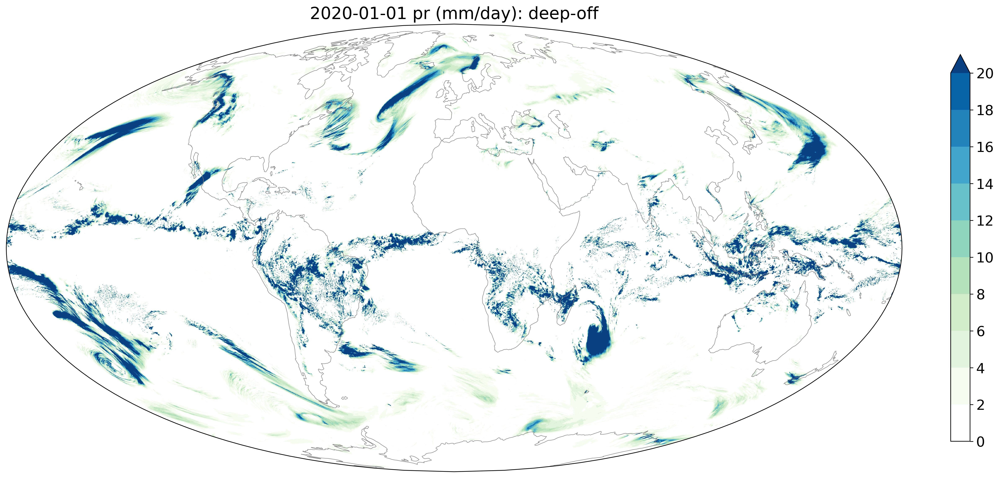

In [67]:
levels = np.arange(0, 21, 2)
# levels = np.arange(0, 5, .5)
extend = 'max'
cmap = get_listed_colormap(levels, cmap='GnBu', extend=extend, white='first')
fig, ax, map_ = default_plot(
    pr['pr_deep-off'].squeeze(), 
    cmap=cmap, 
    levels=levels, 
    extend=extend,
    add_coastlines=True,
)
ax.set_title(f'{day} pr (mm/day): deep-off');
# ax.set_title(f'{day} pr (mm/hour): deep-off');

In [68]:
cat = intake.open_catalog("https://data.nextgems-h2020.eu/catalog.yaml")
ds2 = cat['IFS']['IFS_2.8-FESOM_5-production']['2D_hourly_healpix2048'].to_dask()
tmp = ds2['tp'].sel(time=day).load()
pr['pr_deep-on'] = tmp.resample(time='1D').sum(keep_attrs=True) * 1000 # m/h -> mm/day 
# pr['pr_deep-on'] = ds2['tp'].isel(time=0).load() * 1000 # m/h -> mm/day 

/fastdata/bm1235/python_environments/hamburg-hackathon/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


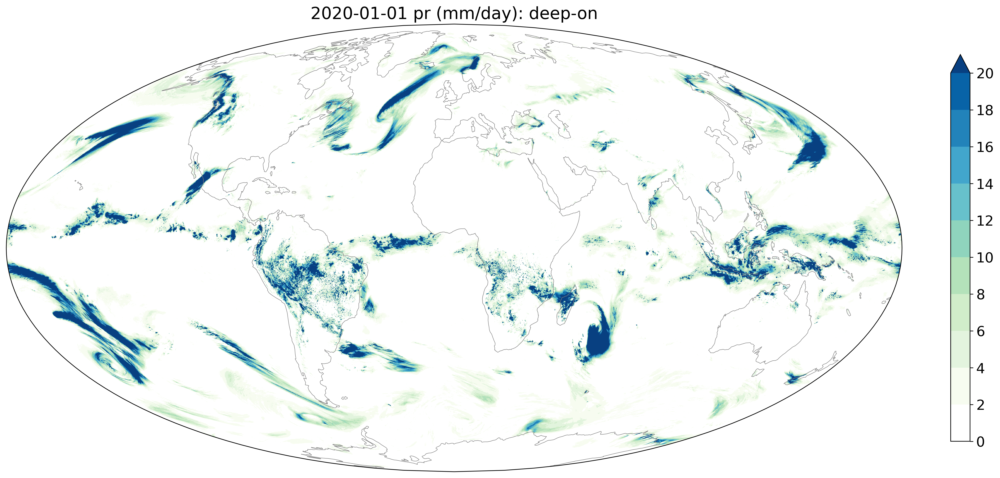

In [69]:
levels=np.arange(0, 21, 2)
extend = 'max'
cmap = get_listed_colormap(levels, cmap='GnBu', extend=extend, white='first')
fig, ax, map_ = default_plot(
    pr['pr_deep-on'].squeeze(), 
    cmap=cmap, 
    levels=levels, 
    extend=extend,
    add_coastlines=True,
)
ax.set_title(f'{day} pr (mm/day): deep-on');
# ax.set_title(f'{day} pr (mm/hour): deep-off');

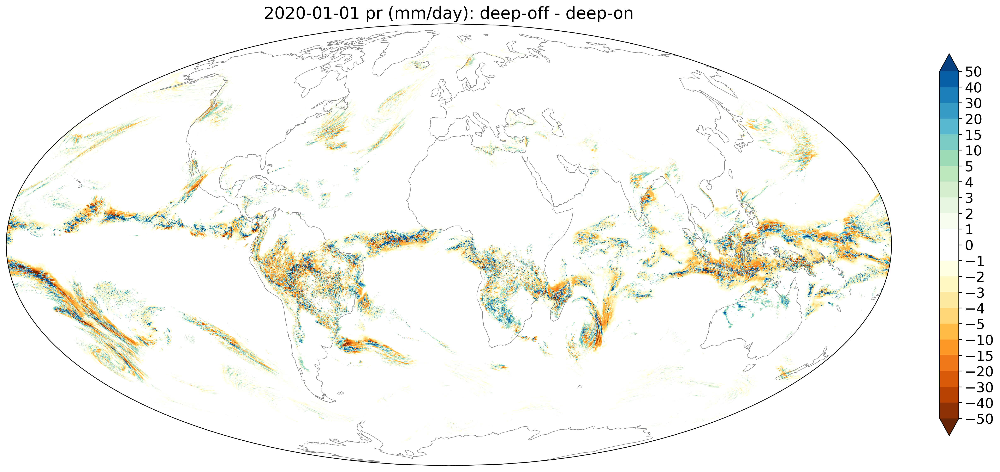

In [73]:
levels = [-50, -40, -30, -20, -15, -10, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50]
extend = 'both'
cmap = get_diverging_colormap(levels, cmap_neg='YlOrBr', cmap_pos='GnBu', return_colors=True, extend=extend)
fig, ax, map_ = default_plot(
    pr['pr_deep-off'].squeeze() - pr['pr_deep-on'].squeeze(), 
    cmap=cmap, 
    levels=levels, 
    extend=extend,
    add_coastlines=True,
)
ax.set_title(f'{day} pr (mm/day): deep-off - deep-on');
# ax.set_title('pr (mm/hour): deep-off - deep-on');

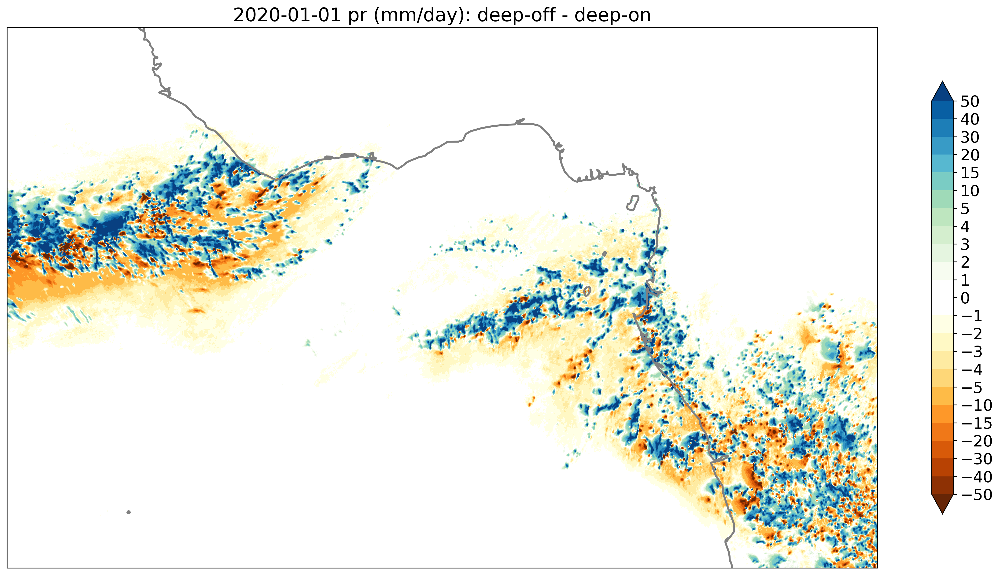

In [74]:
levels = [-50, -40, -30, -20, -15, -10, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50]
extend = 'both'
cmap = get_diverging_colormap(levels, cmap_neg='YlOrBr', cmap_pos='GnBu', return_colors=True, extend=extend)

fig, ax = plt.subplots(
    figsize=(20, 10), 
    dpi=300, 
    subplot_kw={'projection': proj},
)
ax.set_extent([-20, 20, -10, 10])
default_plot(
    pr['pr_deep-off'].squeeze() - pr['pr_deep-on'].squeeze(), 
    ax=ax,
    cmap=cmap, 
    levels=levels, 
    extend=extend,
    add_coastlines=True,
    coastline_kwargs={'lw': 2},
    dpi=600
)
ax.set_title(f'{day} pr (mm/day): deep-off - deep-on');
# plt.savefig('total_precip_2020_off-on_zoom-in.png', dpi=300)

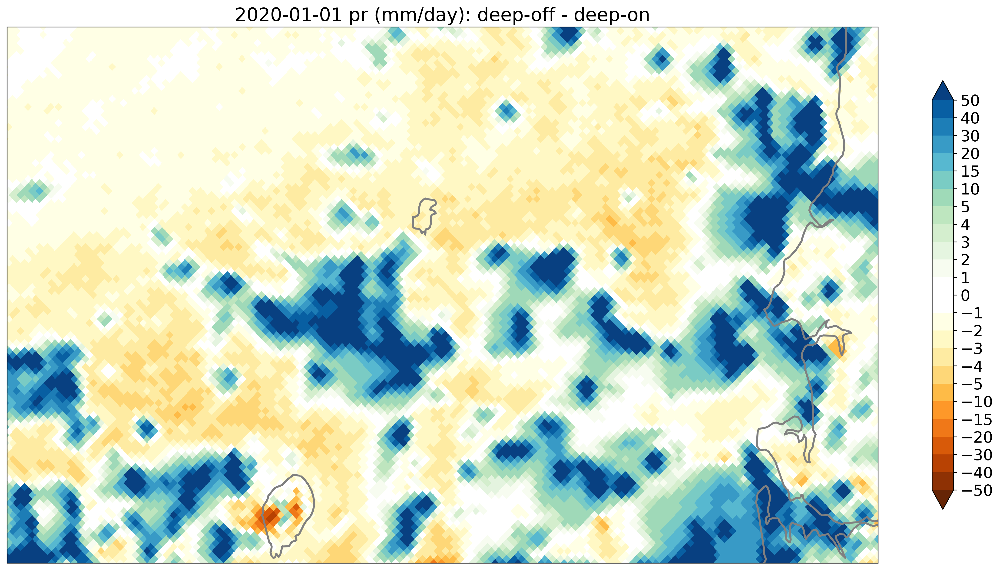

In [75]:
levels = [-50, -40, -30, -20, -15, -10, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 10, 15, 20, 30, 40, 50]
extend = 'both'
cmap = get_diverging_colormap(levels, cmap_neg='YlOrBr', cmap_pos='GnBu', return_colors=True, extend=extend)

fig, ax = plt.subplots(
    figsize=(20, 10), 
    dpi=300, 
    subplot_kw={'projection': proj},
)
ax.set_extent([5, 10, 0, 2.5])
default_plot(
    pr['pr_deep-off'].squeeze() - pr['pr_deep-on'].squeeze(), 
    ax=ax,
    cmap=cmap, 
    levels=levels, 
    extend=extend,
    add_coastlines=True,
    coastline_kwargs={'lw': 2},
    dpi=600
)
ax.set_title(f'{day} pr (mm/day): deep-off - deep-on');
# plt.savefig('total_precip_2020_off-on_zoom-in.png', dpi=300)